# Reinforcement Learning Offline

In [1]:
# import libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import auxiliar_functions as af
import d3rlpy
# You can split dataset into a training dataset and a test dataset just like supervised learning as follows.
from sklearn.model_selection import train_test_split
# Collecting evaluation metrics is important to train algorithms properly. In d3rlpy, the metrics is computed through scikit-learn style scorer functions.
from d3rlpy.metrics.scorer import td_error_scorer
from d3rlpy.metrics.scorer import average_value_estimation_scorer
# the algorithm can be directly evaluated with evaluate_on_environment function if the environment is available to interactF
from d3rlpy.metrics.scorer import evaluate_on_environment
from d3rlpy.datasets import get_cartpole # CartPole-v0 dataset
from d3rlpy.datasets import get_pendulum # Pendulum-v0 dataset
from d3rlpy.datasets import get_pybullet # PyBullet task datasets
from d3rlpy.datasets import get_atari    # Atari 2600 task datasets
from d3rlpy.datasets import get_d4rl     # D4RL datasets
from sklearn.preprocessing import MinMaxScaler

In [2]:
variables_interes=['pyrite law', 'chalcopyrite law',
       'chalcocite law', 'covelin law', 'crusher index', 'sag power index',
       'ball work index', 'bornite law','charge cell', 'TPH','water', 'speed','HH TPH', 'granulometry', 'Edad','loss of TPH',
       "power","solid percentage","HH charge cell","LL charge cell","delta HH TPH","delta HH charge cell","delta LL charge cell"]

In [3]:
# read dictionary
tags=pd.read_excel("..\\data\\tags relevantes.xlsx")
tags_cc=tags.tag.to_list()
dic={}
for i,j in zip(tags.tag,tags.description):
    dic[i]=j

In [4]:
# read data
liners_age=pd.read_csv('../data/liners_age_17December2022.csv', parse_dates=['Timestamp'], index_col='Timestamp')
df=pd.read_csv("..\data\cleaned_15December2022.csv", parse_dates=['Timestamp'], index_col='Timestamp')
df.rename(columns=dic,inplace=True)
df=df.join(liners_age).dropna()
df["delta HH TPH"]=df["HH TPH"]-df["TPH"]
df["delta HH charge cell"]=df["HH charge cell"]-df["charge cell"]
df["delta LL charge cell"]=df["charge cell"]-df["LL charge cell"]
df["loss of TPH"]=df["delta HH TPH"].apply(lambda x: -1 if x>100 else 1)
print(df["loss of TPH"].value_counts())
df=df[variables_interes]

# Done MDP: se considera como tarea finalizada cuando el turno termina a las 12:00
df["terminals"]=df.reset_index().apply(lambda x: 1 if x["Timestamp"].strftime("%H:%M")=="12:00" else 0,axis=1).values
scaler = MinMaxScaler()
df1=pd.DataFrame(scaler.fit_transform(df),columns=df.columns,index=df.index)
df1["loss of TPH"]=df1["loss of TPH"].apply(lambda x: -1 if x==0 else 1)
print(df1["loss of TPH"].value_counts())
df_test=df1.copy()
df1=df1["2020":"2021"]
df1.head(1)

 1    637106
-1    222238
Name: loss of TPH, dtype: int64
 1    637106
-1    222238
Name: loss of TPH, dtype: int64


,pyrite law,chalcopyrite law,chalcocite law,covelin law,crusher index,sag power index,ball work index,bornite law,charge cell,TPH,water,speed,HH TPH,granulometry,Edad,loss of TPH,power,solid percentage,HH charge cell,LL charge cell,delta HH TPH,delta HH charge cell,delta LL charge cell,terminals
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-10 01:00:00,0.444015,0.789238,0.446429,0.1,0.37769,0.376139,0.383857,0.5,0.609431,0.688104,0.618373,0.955671,0.615344,0.271805,0.5,1,0.874088,0.53149,0.538255,0.542151,0.417247,0.327122,0.692901,0.0


In [5]:
df1["loss of TPH"].value_counts()

 1    588725
-1    210719
Name: loss of TPH, dtype: int64

In [8]:
states=[
 'charge cell',
 'water',
 'speed',
 'HH TPH',
 'granulometry',
 'solid percentage',
 'HH charge cell',
 ]

actions=[
    'HH charge cell'
    ]

reward=[
    "loss of TPH"
    ]

In [39]:
# Desfase de 5 minutos para considerar el estado del molino 5 minutos antes de tomar la decisión
df1[states]=df1[states].shift(5)
df1.dropna(inplace=True)
df1.head()

,pyrite law,chalcopyrite law,chalcocite law,covelin law,crusher index,sag power index,ball work index,bornite law,charge cell,TPH,water,speed,HH TPH,granulometry,Edad,loss of TPH,power,solid percentage,HH charge cell,LL charge cell,delta HH TPH,delta HH charge cell,delta LL charge cell,terminals
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-10 01:05:00,0.444015,0.789238,0.446429,0.1,0.37769,0.376139,0.383857,0.5,None,0.677516,None,None,None,None,0.5,1,0.879417,None,None,0.542151,0.424040,0.327626,0.692382,0.0
2020-01-10 01:06:00,0.444015,0.789238,0.446429,0.1,0.37769,0.376139,0.383857,0.5,None,0.665118,None,None,None,None,0.5,1,0.879484,None,None,0.542151,0.431995,0.329174,0.690788,0.0
2020-01-10 01:07:00,0.444015,0.789238,0.446429,0.1,0.37769,0.376139,0.383857,0.5,None,0.683112,None,None,None,None,0.5,1,0.877351,None,None,0.542151,0.420450,0.330805,0.689108,0.0
2020-01-10 01:08:00,0.444015,0.789238,0.446429,0.1,0.37769,0.376139,0.383857,0.5,None,0.674623,None,None,None,None,0.5,1,0.877136,None,None,0.542151,0.425897,0.332351,0.687516,0.0
2020-01-10 01:09:00,0.444015,0.789238,0.446429,0.1,0.37769,0.376139,0.383857,0.5,None,0.690166,None,None,None,None,0.5,1,0.876511,None,None,0.542151,0.415924,0.333874,0.685948,0.0


In [10]:
dataset, env = get_pendulum()
episode = dataset.episodes[0]

# access to episode data
print(episode.observations.shape)
print(episode.actions.shape)
print(episode.rewards.shape)


(201, 3)
(201, 1)
(201,)


In [11]:
observations=df1[states].to_numpy()
actions=df1[actions].to_numpy().reshape(-1,1)
rewards=df1[reward].to_numpy().squeeze()
terminals=df1["terminals"].to_numpy()
dataset = d3rlpy.dataset.MDPDataset(
    observations=observations,
    actions=actions,
    rewards=rewards,
    terminals=terminals,
)
print(observations.shape)
print(actions.shape)
print(rewards.shape)
episode = dataset.episodes[0]

# access to episode data
print(episode.observations.shape)
print(episode.actions.shape)
print(episode.rewards.shape)

(799439, 7)
(799439, 1)
(799439,)
(656, 7)
(656, 1)
(656,)


In [12]:
# first episode
episode = dataset.episodes[0]

# access to episode data
episode.observations
episode.actions
episode.rewards

# first transition
transition = episode.transitions[0]

# access to tuple
transition.observation
transition.action
transition.reward
transition.next_observation

# linked list structure
next_transition = transition.next_transition
assert transition is next_transition.prev_transition

In [13]:
# episode-wise split
train_episodes, test_episodes = train_test_split(dataset.episodes)

# setup metrics
metrics = {
  "soft_opc": d3rlpy.metrics.scorer.soft_opc_scorer(return_threshold=180),
  "initial_value": d3rlpy.metrics.scorer.initial_state_value_estimation_scorer,
}

awac = d3rlpy.algos.AWAC()

# start training with episode-wise splits
data_train=awac.fit(
    train_episodes,
    n_epochs=10,
    scorers=metrics,
    eval_episodes=test_episodes,
)

2023-07-24 15:13.35 [debug    ] RoundIterator is selected.
2023-07-24 15:13.35 [info     ] Directory is created at d3rlpy_logs\AWAC_20230724151335
2023-07-24 15:13.35 [debug    ] Building models...
2023-07-24 15:13.35 [debug    ] Models have been built.
2023-07-24 15:13.35 [info     ] Parameters are saved to d3rlpy_logs\AWAC_20230724151335\params.json params={'action_scaler': None, 'actor_encoder_factory': {'type': 'default', 'params': {'activation': 'relu', 'use_batch_norm': False, 'dropout_rate': None}}, 'actor_learning_rate': 0.0003, 'actor_optim_factory': {'optim_cls': 'Adam', 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0.0001, 'amsgrad': False}, 'batch_size': 1024, 'critic_encoder_factory': {'type': 'default', 'params': {'activation': 'relu', 'use_batch_norm': False, 'dropout_rate': None}}, 'critic_learning_rate': 0.0003, 'critic_optim_factory': {'optim_cls': 'Adam', 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0, 'amsgrad': False}, 'gamma': 0.99, 'generated_maxle

Epoch 1/10: 100%|██████████| 580/580 [00:34<00:00, 16.73it/s, critic_loss=1.3, actor_loss=0.434, mean_std=0.0515] 


2023-07-24 15:14.13 [info     ] AWAC_20230724151335: epoch=1 step=580 epoch=1 metrics={'time_sample_batch': 0.002638917133725923, 'time_algorithm_update': 0.05645690252040995, 'critic_loss': 1.2952032319430646, 'actor_loss': 0.4165483976361053, 'mean_std': 0.05150607639345629, 'time_step': 0.05927264608185867, 'soft_opc': 0.09873329434124867, 'initial_value': 2.0142436027526855} step=580
2023-07-24 15:14.13 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_580.pt


Epoch 2/10: 100%|██████████| 580/580 [00:34<00:00, 16.79it/s, critic_loss=1.23, actor_loss=-.767, mean_std=0.0552]


2023-07-24 15:14.50 [info     ] AWAC_20230724151335: epoch=2 step=1160 epoch=2 metrics={'time_sample_batch': 0.002685245974310513, 'time_algorithm_update': 0.05617217400978351, 'critic_loss': 1.2340132222093385, 'actor_loss': -0.768097523831088, 'mean_std': 0.05522126489929084, 'time_step': 0.05902874963036899, 'soft_opc': 0.15832096654340289, 'initial_value': 3.7332375049591064} step=1160
2023-07-24 15:14.50 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_1160.pt


Epoch 3/10: 100%|██████████| 580/580 [00:39<00:00, 14.57it/s, critic_loss=1.29, actor_loss=-.927, mean_std=0.06]  


2023-07-24 15:15.32 [info     ] AWAC_20230724151335: epoch=3 step=1740 epoch=3 metrics={'time_sample_batch': 0.0026618493014368516, 'time_algorithm_update': 0.06525368731597374, 'critic_loss': 1.286179701213179, 'actor_loss': -0.927910556361593, 'mean_std': 0.0600747073133444, 'time_step': 0.06807725840601428, 'soft_opc': 0.23257670942121056, 'initial_value': 5.294287204742432} step=1740
2023-07-24 15:15.32 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_1740.pt


Epoch 4/10: 100%|██████████| 580/580 [00:54<00:00, 10.67it/s, critic_loss=1.35, actor_loss=-1.05, mean_std=0.0656]


2023-07-24 15:16.28 [info     ] AWAC_20230724151335: epoch=4 step=2320 epoch=4 metrics={'time_sample_batch': 0.0026236599889294856, 'time_algorithm_update': 0.09039461160528249, 'critic_loss': 1.3550868013809467, 'actor_loss': -1.05331106432553, 'mean_std': 0.06565396396507477, 'time_step': 0.09317737447804418, 'soft_opc': 0.29744483597778526, 'initial_value': 6.917797565460205} step=2320
2023-07-24 15:16.28 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_2320.pt


Epoch 5/10: 100%|██████████| 580/580 [01:22<00:00,  7.04it/s, critic_loss=1.46, actor_loss=-1.13, mean_std=0.0714]


2023-07-24 15:17.53 [info     ] AWAC_20230724151335: epoch=5 step=2900 epoch=5 metrics={'time_sample_batch': 0.0031994092053380507, 'time_algorithm_update': 0.1375180067687199, 'critic_loss': 1.4604688553974545, 'actor_loss': -1.1311073905435103, 'mean_std': 0.07149104872911141, 'time_step': 0.14093264916847492, 'soft_opc': 0.3576440401338363, 'initial_value': 8.392168045043945} step=2900
2023-07-24 15:17.53 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_2900.pt


Epoch 6/10: 100%|██████████| 580/580 [01:24<00:00,  6.84it/s, critic_loss=1.58, actor_loss=-1.18, mean_std=0.0774]


2023-07-24 15:19.20 [info     ] AWAC_20230724151335: epoch=6 step=3480 epoch=6 metrics={'time_sample_batch': 0.0030704954574848043, 'time_algorithm_update': 0.14168812899753966, 'critic_loss': 1.5791331165823443, 'actor_loss': -1.1789651366143392, 'mean_std': 0.07745017730470362, 'time_step': 0.14495623563898022, 'soft_opc': 0.41522027550400686, 'initial_value': 9.598888397216797} step=3480
2023-07-24 15:19.20 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_3480.pt


Epoch 7/10: 100%|██████████| 580/580 [01:20<00:00,  7.17it/s, critic_loss=1.73, actor_loss=-1.21, mean_std=0.083] 


2023-07-24 15:20.44 [info     ] AWAC_20230724151335: epoch=7 step=4060 epoch=7 metrics={'time_sample_batch': 0.002990133597933013, 'time_algorithm_update': 0.13526228830732148, 'critic_loss': 1.731878898061555, 'actor_loss': -1.2076503728998118, 'mean_std': 0.08304826167636904, 'time_step': 0.13844778003363772, 'soft_opc': 0.4766674983495527, 'initial_value': 10.624044418334961} step=4060
2023-07-24 15:20.44 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_4060.pt


Epoch 8/10: 100%|██████████| 580/580 [01:15<00:00,  7.72it/s, critic_loss=1.89, actor_loss=-1.22, mean_std=0.088] 


2023-07-24 15:22.01 [info     ] AWAC_20230724151335: epoch=8 step=4640 epoch=8 metrics={'time_sample_batch': 0.002748574470651561, 'time_algorithm_update': 0.12552765607833863, 'critic_loss': 1.8921676658350846, 'actor_loss': -1.223693319538544, 'mean_std': 0.08800384451089234, 'time_step': 0.12843718652067512, 'soft_opc': 0.5311576761767629, 'initial_value': 11.811925888061523} step=4640
2023-07-24 15:22.01 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_4640.pt


Epoch 9/10: 100%|██████████| 580/580 [01:24<00:00,  6.89it/s, critic_loss=2.05, actor_loss=-1.23, mean_std=0.092] 


2023-07-24 15:23.28 [info     ] AWAC_20230724151335: epoch=9 step=5220 epoch=9 metrics={'time_sample_batch': 0.002898820926403177, 'time_algorithm_update': 0.14109368529813043, 'critic_loss': 2.0520441258775777, 'actor_loss': -1.2313999134918738, 'mean_std': 0.09203023038290697, 'time_step': 0.14415130409701118, 'soft_opc': 0.5821911385387963, 'initial_value': 12.77573299407959} step=5220
2023-07-24 15:23.28 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_5220.pt


Epoch 10/10: 100%|██████████| 580/580 [01:41<00:00,  5.74it/s, critic_loss=2.21, actor_loss=-1.23, mean_std=0.0949]


2023-07-24 15:25.11 [info     ] AWAC_20230724151335: epoch=10 step=5800 epoch=10 metrics={'time_sample_batch': 0.003107229183460104, 'time_algorithm_update': 0.16969135095333232, 'critic_loss': 2.211729216986689, 'actor_loss': -1.2324125929125425, 'mean_std': 0.09496359957446313, 'time_step': 0.17299767650406936, 'soft_opc': 0.6186581292793001, 'initial_value': 13.825267791748047} step=5800
2023-07-24 15:25.11 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724151335\model_5800.pt


In [11]:
# save full parameters only
awac.save_model('../models/awac.pt')


In [12]:
# load full parameters with manual setup
awac =d3rlpy.algos.AWAC()
awac.build_with_dataset(dataset)
awac.load_model('../models/awac.pt')

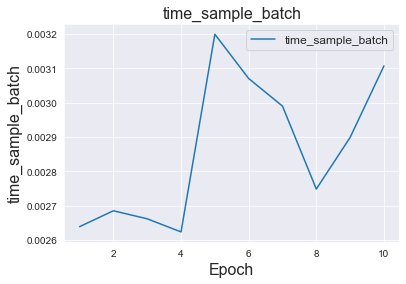

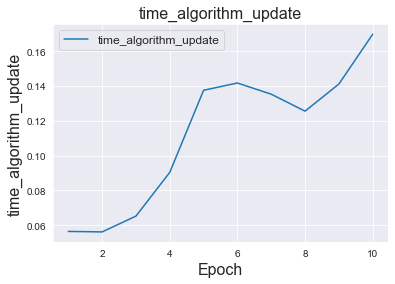

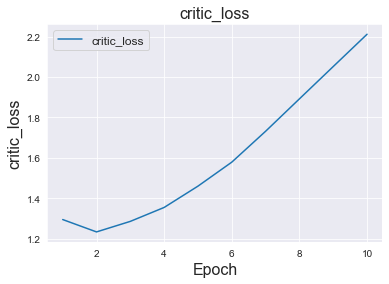

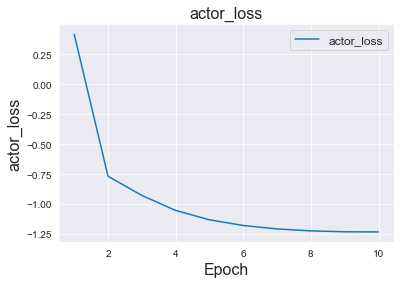

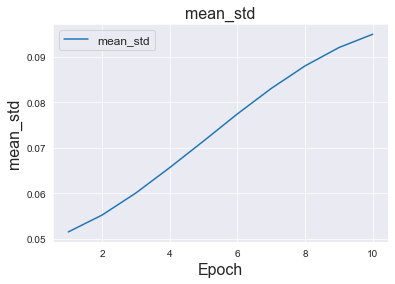

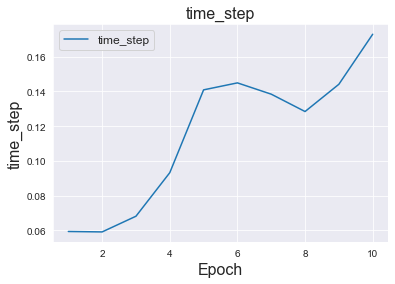

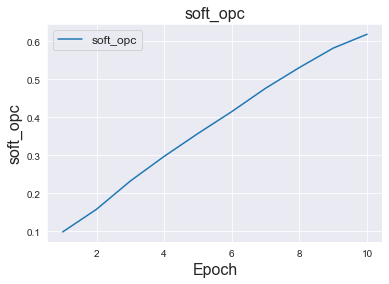

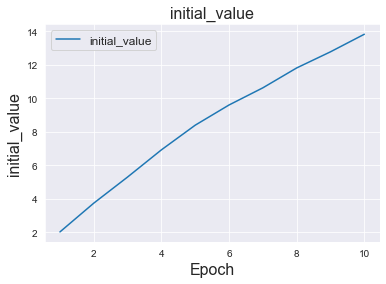

In [14]:
# Métricas que queremos graficar
metrics_to_plot = list(data_train[0][1].keys())

# Crear un gráfico de líneas para cada métrica
for metric in metrics_to_plot:
    x = [entry[0] for entry in data_train]
    y = [entry[1][metric] for entry in data_train]
    plt.plot(x, y, label=metric)

    # Etiquetas y título del gráfico
    plt.title(f'{metric}', fontsize=16)

    # Agrandar el tamaño de fuente de la leyenda
    plt.legend(fontsize=12)

    # Etiquetas y título del gráfico
    plt.xlabel('Epoch', fontsize=16)
    plt.ylabel(metric, fontsize=16)

    # Mostrar el gráfico
    plt.show()

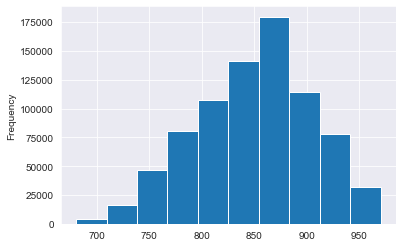

In [15]:
#  rec HH charge cell data train
df_fin=df1.copy()
df_fin["HH charge cell"]=awac.predict([observations]).squeeze()

df_fin=pd.DataFrame(scaler.inverse_transform(df_fin),columns=df_fin.columns,index=df_fin.index).rename(columns={"HH charge cell":
                                                                                                       "recommendation HH charge cell"})
df_fin["recommendation HH charge cell"].plot(kind="hist")
plt.show()

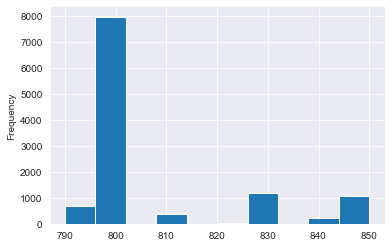

In [16]:
# distribución data train
pd.Series(pd.DataFrame(scaler.inverse_transform(df_test),columns=df_test.columns,index=df_test.index)["HH charge cell"]["2020-01":"2020-02"]).plot(kind="hist")
plt.show()

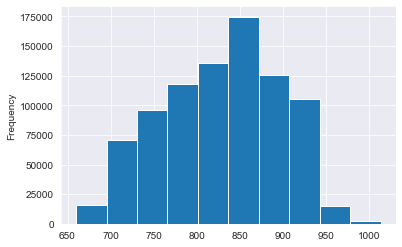

count    859344.000000
mean        829.509601
std          66.848601
min         660.000000
25%         780.000000
50%         830.000000
75%         880.000000
max        1012.992509
Name: HH charge cell, dtype: float64

In [17]:
# distribución del total de la data
pd.Series(pd.DataFrame(scaler.inverse_transform(df_test),columns=df_test.columns,index=df_test.index)["HH charge cell"]).plot(kind="hist")
plt.show()
pd.Series(pd.DataFrame(scaler.inverse_transform(df_test),columns=df_test.columns,index=df_test.index)["HH charge cell"]).describe()

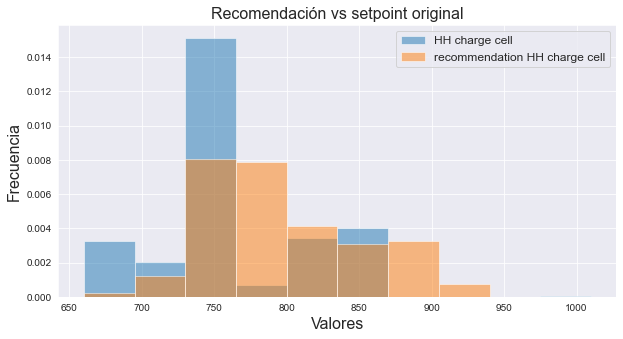

,HH charge cell,recommendation HH charge cell
count,35717.0,35717.0
mean,759.0,798.0
std,52.0,53.0
min,660.0,680.0
25%,740.0,759.0
50%,740.0,781.0
75%,800.0,835.0
max,1010.0,941.0


In [44]:
# Test
test=df_test.copy()["2020-12"]
original_hh_charge_cell=pd.DataFrame(scaler.inverse_transform(test),columns=test.columns,index=test.index)["HH charge cell"].values

observations=test[states].to_numpy()
test["HH charge cell"]=awac.predict([observations]).squeeze()

# Recomendación futura
test["HH charge cell"]=test["HH charge cell"].shift(-5)

df_fin=pd.DataFrame(scaler.inverse_transform(test),columns=test.columns,index=test.index).rename(columns={"HH charge cell":
                                                                                                       "recommendation HH charge cell"})
df_fin["HH charge cell"]=original_hh_charge_cell
df_fin.dropna(inplace=True)


ax=df_fin[["HH charge cell","recommendation HH charge cell"]].plot(kind="hist",alpha=0.5,figsize=(10,5),density=True,)
ax.set_title("Recomendación vs setpoint original",fontsize=16)
ax.set_xlabel('Valores', fontsize=16)
ax.set_ylabel('Frecuencia', fontsize=16)
ax.legend(fontsize=12)
plt.show()
df_fin[["HH charge cell","recommendation HH charge cell"]].describe().round(0)

In [43]:
titulos=tuple(["TPH & HH TPH", "charge cell","granulometry","speed","solid percentage"])
fig = make_subplots(
    rows=5, cols=1,
    subplot_titles=titulos,
    #subplot_titles=tuple("TPH y HH TPH,"),
     shared_xaxes=True, vertical_spacing=0.05
    )

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['TPH'], ##FF6511
                    mode='lines',
                    name="TPH",line=dict(width=3, ),legendgroup = '1'),row=1, col=1)  

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['HH TPH'], ##FF6511
                    mode='lines',
                    name="HH TPH",line=dict(width=3, ),legendgroup = '1'),row=1, col=1)  

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['charge cell'], 
                    mode='lines',
                    name="charge cell",line=dict(width=3, ),legendgroup = '1'),row=2, col=1)  

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['HH charge cell'], 
                    mode='lines',
                    name="HH charge cell",line=dict(width=3, ),legendgroup = '1'),row=2, col=1) 

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['recommendation HH charge cell'], 
                    mode='lines',
                    name="recommendation HH charge cell",line=dict(width=3, ),legendgroup = '1'),row=2, col=1) 

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['HH charge cell']-80, 
                    mode='lines',
                    name="LL charge cell",line=dict(width=3, ),legendgroup = '1'),row=2, col=1)   

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['granulometry'], ##FF6511
                    mode='lines',
                    name='granulometry',line=dict(width=3,),legendgroup = '1'),row=3, col=1)  


fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['speed'], ##FF6511
                    mode='lines',
                    name="speed",line=dict(width=3, ),legendgroup = '1'),row=4, col=1)  

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['solid percentage'], ##FF6511
                    mode='lines',
                    name='solid percentage',line=dict(width=3, ),legendgroup = '1'),row=5, col=1)  


fig.update_layout(height=700, width=1000, title_text="Temporal signal analysis")
fig.update_layout(hovermode="x unified")

fig.show()

# Create Your Dataset

**The data collection API is introduced in Data Collection. In this tutorial, you can learn how to build your dataset from logged data such as the user data collected in your web service.**

### Prepare Logged Data

**First of all, you need to prepare your logged data. In this tutorial, let’s use randomly generated data. terminals represents the last step of episodes. If terminals[i] == 1.0, i-th step is the terminal state. Otherwise you need to set zeros for non-terminal states.**

In [18]:
# vector observation
# 1000 steps of observations with shape of (100,)
observations = np.random.random((1000, 100))

# 1000 steps of actions with shape of (4,)
actions = np.random.random((1000, 4))
actions=np.random.randint(2, size=1000)
# 1000 steps of rewards
rewards = np.random.random(1000)

# 1000 steps of terminal flags
terminals = np.random.randint(2, size=1000)

In [19]:
dataset = d3rlpy.dataset.MDPDataset(
    observations=observations,
    actions=actions,
    rewards=rewards,
    terminals=terminals,
)

In [20]:
# You can make your own dataset without any efforts. In this tutorial, let’s use integrated datasets to start. If you want to make a new dataset, see MDPDataset.
#ataset, env = get_cartpole()
dataset, env = get_pendulum()

In [21]:
# first episode
episode = dataset.episodes[0]

# access to episode data
episode.observations
episode.actions
episode.rewards

# first transition
transition = episode.transitions[0]

# access to tuple
transition.observation
transition.action
transition.reward
transition.next_observation

# linked list structure
next_transition = transition.next_transition
assert transition is next_transition.prev_transition

In [22]:
dqn = d3rlpy.algos.AWAC(use_gpu=False)

In [23]:
# initialize neural networks with the given observation shape and action size.
# this is not necessary when you directly call fit or fit_online method.
dqn.build_with_dataset(dataset)

In [24]:
# episode-wise split
train_episodes, test_episodes = train_test_split(dataset.episodes)

In [25]:
# set environment in scorer function
evaluate_scorer = evaluate_on_environment(env)

In [26]:
# episode-wise split
#train_episodes, test_episodes = train_test_split(dataset.episodes)

# setup metrics
metrics = {
  "soft_opc": d3rlpy.metrics.scorer.soft_opc_scorer(return_threshold=180),
  "initial_value": d3rlpy.metrics.scorer.initial_state_value_estimation_scorer,
  'environment': evaluate_scorer
}

# start training with episode-wise splits
data_train=dqn.fit(
    train_episodes,
    #n_steps=10000,
    scorers=metrics,
    n_epochs=10,
    eval_episodes=test_episodes,
)

2023-07-24 14:28.34 [debug    ] RoundIterator is selected.
2023-07-24 14:28.34 [info     ] Directory is created at d3rlpy_logs\AWAC_20230724142834
2023-07-24 14:28.34 [warning  ] Skip building models since they're already built.
2023-07-24 14:28.34 [info     ] Parameters are saved to d3rlpy_logs\AWAC_20230724142834\params.json params={'action_scaler': None, 'actor_encoder_factory': {'type': 'default', 'params': {'activation': 'relu', 'use_batch_norm': False, 'dropout_rate': None}}, 'actor_learning_rate': 0.0003, 'actor_optim_factory': {'optim_cls': 'Adam', 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0.0001, 'amsgrad': False}, 'batch_size': 1024, 'critic_encoder_factory': {'type': 'default', 'params': {'activation': 'relu', 'use_batch_norm': False, 'dropout_rate': None}}, 'critic_learning_rate': 0.0003, 'critic_optim_factory': {'optim_cls': 'Adam', 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0, 'amsgrad': False}, 'gamma': 0.99, 'generated_maxlen': 100000, 'lam': 1.0, '

Epoch 1/10: 100%|██████████| 72/72 [00:03<00:00, 19.18it/s, critic_loss=5.06, actor_loss=2.76e+3, mean_std=0.0506]


2023-07-24 14:28.39 [info     ] AWAC_20230724142834: epoch=1 step=72 epoch=1 metrics={'time_sample_batch': 0.0022590623961554635, 'time_algorithm_update': 0.04939034250047472, 'critic_loss': 5.013509776857164, 'actor_loss': 2753.4353535970054, 'mean_std': 0.05057657235819432, 'time_step': 0.05181593034002516, 'soft_opc': nan, 'initial_value': -1.8957304954528809, 'environment': -927.0695060041593} step=72
2023-07-24 14:28.39 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_72.pt


Epoch 2/10: 100%|██████████| 72/72 [00:04<00:00, 16.31it/s, critic_loss=0.913, actor_loss=2.31e+3, mean_std=0.0521]


2023-07-24 14:28.45 [info     ] AWAC_20230724142834: epoch=2 step=144 epoch=2 metrics={'time_sample_batch': 0.002384556664360894, 'time_algorithm_update': 0.058219479189978704, 'critic_loss': 0.9069711739818255, 'actor_loss': 2312.3473002115884, 'mean_std': 0.052092323183185525, 'time_step': 0.060828066534466214, 'soft_opc': nan, 'initial_value': -3.1181411743164062, 'environment': -675.5598267149812} step=144
2023-07-24 14:28.45 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_144.pt


Epoch 3/10: 100%|██████████| 72/72 [00:06<00:00, 10.55it/s, critic_loss=0.343, actor_loss=2.02e+3, mean_std=0.0536]


2023-07-24 14:28.56 [info     ] AWAC_20230724142834: epoch=3 step=216 epoch=3 metrics={'time_sample_batch': 0.002974006864759657, 'time_algorithm_update': 0.09085523751046923, 'critic_loss': 0.3431896714286672, 'actor_loss': 2016.4578637017144, 'mean_std': 0.05356575419298477, 'time_step': 0.09406219588385688, 'soft_opc': nan, 'initial_value': -4.091019630432129, 'environment': -674.9359477268738} step=216
2023-07-24 14:28.56 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_216.pt


Epoch 4/10: 100%|██████████| 72/72 [00:09<00:00,  7.94it/s, critic_loss=0.213, actor_loss=1.85e+3, mean_std=0.055] 


2023-07-24 14:29.08 [info     ] AWAC_20230724142834: epoch=4 step=288 epoch=4 metrics={'time_sample_batch': 0.0034575098090701634, 'time_algorithm_update': 0.1212943693002065, 'critic_loss': 0.21172013899518383, 'actor_loss': 1846.5258331298828, 'mean_std': 0.055015383340004415, 'time_step': 0.12501155998971727, 'soft_opc': nan, 'initial_value': -4.93760871887207, 'environment': -827.7903350165267} step=288
2023-07-24 14:29.08 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_288.pt


Epoch 5/10: 100%|██████████| 72/72 [00:05<00:00, 12.05it/s, critic_loss=0.155, actor_loss=1.73e+3, mean_std=0.0565]


2023-07-24 14:29.16 [info     ] AWAC_20230724142834: epoch=5 step=360 epoch=5 metrics={'time_sample_batch': 0.0029241210884518093, 'time_algorithm_update': 0.07922511299451192, 'critic_loss': 0.15384140848699543, 'actor_loss': 1732.668728298611, 'mean_std': 0.05646335442240039, 'time_step': 0.08233901858329773, 'soft_opc': nan, 'initial_value': -5.823370933532715, 'environment': -765.4205318561696} step=360
2023-07-24 14:29.16 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_360.pt


Epoch 6/10: 100%|██████████| 72/72 [00:06<00:00, 11.16it/s, critic_loss=0.122, actor_loss=1.65e+3, mean_std=0.0579]


2023-07-24 14:29.25 [info     ] AWAC_20230724142834: epoch=6 step=432 epoch=6 metrics={'time_sample_batch': 0.0030802985032399497, 'time_algorithm_update': 0.08556973934173584, 'critic_loss': 0.12187550589442253, 'actor_loss': 1644.4663764105903, 'mean_std': 0.057931909130679235, 'time_step': 0.08885128299395244, 'soft_opc': nan, 'initial_value': -6.7229509353637695, 'environment': -549.4586082652232} step=432
2023-07-24 14:29.25 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_432.pt


Epoch 7/10: 100%|██████████| 72/72 [00:06<00:00, 11.76it/s, critic_loss=0.106, actor_loss=1.57e+3, mean_std=0.0594]


2023-07-24 14:29.34 [info     ] AWAC_20230724142834: epoch=7 step=504 epoch=7 metrics={'time_sample_batch': 0.003119005097283257, 'time_algorithm_update': 0.0810793141523997, 'critic_loss': 0.10635289880964491, 'actor_loss': 1568.8907725016277, 'mean_std': 0.05942190014239815, 'time_step': 0.084403395652771, 'soft_opc': nan, 'initial_value': -7.664116382598877, 'environment': -260.0066482520556} step=504
2023-07-24 14:29.34 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_504.pt


Epoch 8/10: 100%|██████████| 72/72 [00:06<00:00, 11.16it/s, critic_loss=0.0941, actor_loss=1.49e+3, mean_std=0.0609]


2023-07-24 14:29.43 [info     ] AWAC_20230724142834: epoch=8 step=576 epoch=8 metrics={'time_sample_batch': 0.0031590494844648573, 'time_algorithm_update': 0.08552154567506579, 'critic_loss': 0.09394593542027804, 'actor_loss': 1488.6768714057075, 'mean_std': 0.06094475985608167, 'time_step': 0.08888739678594801, 'soft_opc': nan, 'initial_value': -8.692264556884766, 'environment': -293.6557542132014} step=576
2023-07-24 14:29.43 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_576.pt


Epoch 9/10: 100%|██████████| 72/72 [00:06<00:00, 11.96it/s, critic_loss=0.0872, actor_loss=1.41e+3, mean_std=0.0625]


2023-07-24 14:29.52 [info     ] AWAC_20230724142834: epoch=9 step=648 epoch=9 metrics={'time_sample_batch': 0.003049953116310967, 'time_algorithm_update': 0.07959503597683376, 'critic_loss': 0.08735695708956984, 'actor_loss': 1408.5247497558594, 'mean_std': 0.062469909329795174, 'time_step': 0.08284939659966363, 'soft_opc': nan, 'initial_value': -9.756051063537598, 'environment': -310.53801432416765} step=648
2023-07-24 14:29.52 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_648.pt


Epoch 10/10: 100%|██████████| 72/72 [00:07<00:00,  9.83it/s, critic_loss=0.081, actor_loss=1.34e+3, mean_std=0.064]  


2023-07-24 14:30.03 [info     ] AWAC_20230724142834: epoch=10 step=720 epoch=10 metrics={'time_sample_batch': 0.0031397706932491725, 'time_algorithm_update': 0.0975986189312405, 'critic_loss': 0.08074134386455019, 'actor_loss': 1337.3114166259766, 'mean_std': 0.06398441642522812, 'time_step': 0.10093315773540074, 'soft_opc': nan, 'initial_value': -10.844995498657227, 'environment': -312.70645317320475} step=720
2023-07-24 14:30.03 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230724142834\model_720.pt


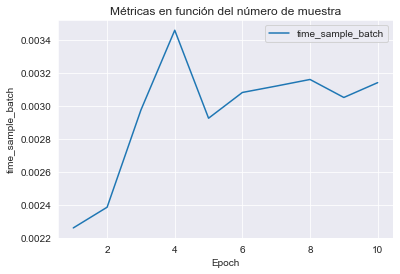

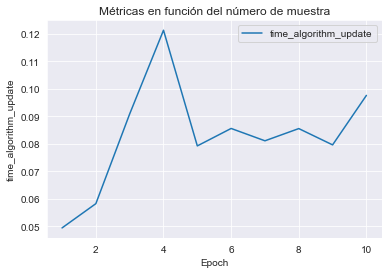

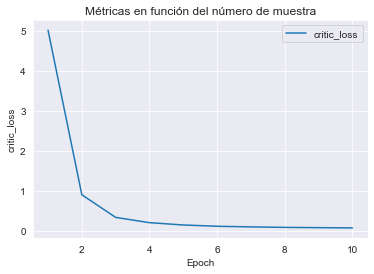

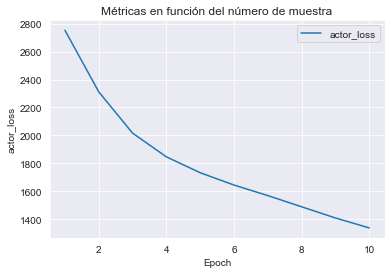

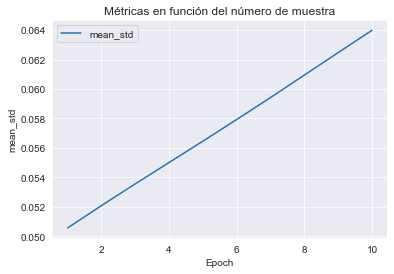

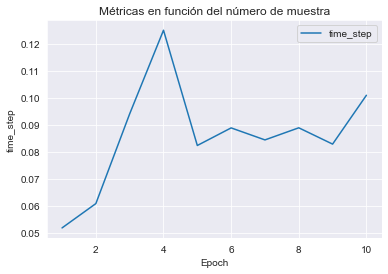

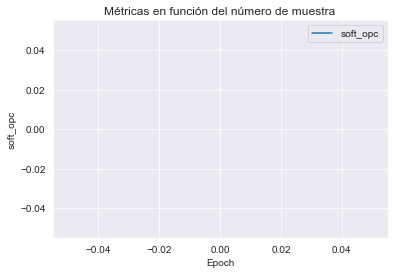

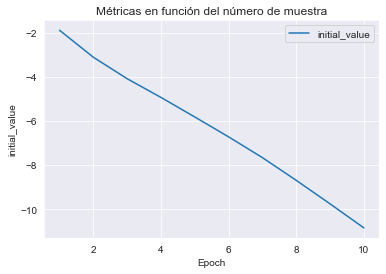

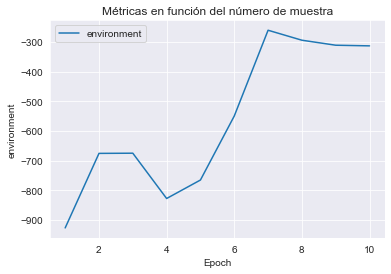

In [27]:
# Métricas que queremos graficar
metrics_to_plot = list(data_train[0][1].keys())

# Crear un gráfico de líneas para cada métrica
for metric in metrics_to_plot:
    x = [entry[0] for entry in data_train]
    y = [entry[1][metric] for entry in data_train]
    plt.plot(x, y, label=metric)

    # Etiquetas y título del gráfico
    plt.xlabel('Epoch')
    plt.ylabel(metric)
    plt.title('Métricas en función del número de muestra')
    plt.legend()

    # Mostrar el gráfico
    plt.show()

In [28]:
# Once the training is done, your algorithm is ready to make decisions.
observation = env.reset()

# return actions based on the greedy-policy
action = dqn.predict([observation])[0]

# estimate action-values
value = dqn.predict_value([observation], [action])[0]

In [74]:
# save full parameters only
dqn.save_model('dqn.pt')
# load full parameters with manual setup
dqn3 =d3rlpy.algos.DQN()
dqn3.build_with_dataset(dataset)
dqn3.load_model('dqn.pt')